In [1]:
# %install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, MultiPoint
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx
import rasterio

time: 1.46 s (started: 2021-08-15 10:24:00 +02:00)


In [2]:
# in case of encountering problems with GEOS or GDAL, disable speedups from shapely
from shapely import speedups
speedups.disable()

time: 402 µs (started: 2021-08-15 10:24:01 +02:00)


lyon coordinate reference system:  epsg:4326
Projected Lyon coordinate reference system:  +proj=utm +zone=31 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


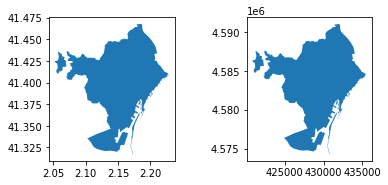

time: 480 ms (started: 2021-08-15 10:24:01 +02:00)


In [3]:
# load Milan city from openstreetmap using osmmnx api

city_name = 'Barcelona, Spain'
city = ox.geocode_to_gdf(city_name)
print('lyon coordinate reference system: ', city.crs)

# project to the local coordinate reference system
city_proj = ox.projection.project_gdf(city)
print('Projected Lyon coordinate reference system: ', city_proj.crs)

fig, (ax1, ax2) = plt.subplots(1, 2)
city.plot(ax=ax1, ec='none')
city_proj.plot(ax=ax2, ec='none' )
plt.tight_layout(pad=3.0)
plt.show()

In [4]:
# convert to "ESRI:54009" coordinate system, since that's the system NASA uses
city = city.to_crs("ESRI:54009") 
print(city.crs)

ESRI:54009
time: 221 ms (started: 2021-08-15 10:24:02 +02:00)


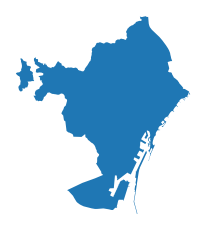

time: 80.3 ms (started: 2021-08-15 10:24:02 +02:00)


In [5]:
# plot city in new projection
ax = city.plot(ec='none')
_ = ax.axis('off')

In [6]:
# save to file
city.to_file('lyon_54009.shp')

time: 64.5 ms (started: 2021-08-15 10:24:02 +02:00)


<ipython-input-6-55cb50a5764a>:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file('lyon_54009.shp')


In [7]:
# load the saved file
import fiona
with fiona.open("lyon_54009.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

time: 174 ms (started: 2021-08-15 10:24:02 +02:00)


In [8]:
# load the NASA population density raster file
# Data source: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4
import rasterio.mask
with rasterio.open("data/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0.tif") as src:
    # since the NASA data is for the entire world, we will use the 'shapes' polygon containing our city to mask out
    # the population raster data corresponding to our city
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True, nodata=0)
    out_meta = src.meta

time: 117 ms (started: 2021-08-15 10:24:02 +02:00)


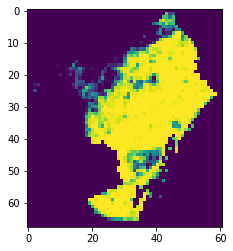

time: 92.3 ms (started: 2021-08-15 10:24:02 +02:00)


In [9]:
# plot city population 
plt.imshow(out_image[0,:,:])
plt.show()

In [10]:

# since the raster array contains many dimensions, we assign the dimension containing the population density data to a new 
# variable
pop_density = out_image[0,:,:]
pop_density

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

time: 2.94 ms (started: 2021-08-15 10:24:02 +02:00)


In [11]:
# just in case, set all negative values to zero
pop_density[pop_density < 0] = 0

time: 444 µs (started: 2021-08-15 10:24:02 +02:00)


In [12]:
# split city into 400 x 400 meter grid cells
geometry = city_proj['geometry'].iloc[0]
print(type(geometry))
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 400)
print(type(geometry_cut))

<class 'shapely.geometry.multipolygon.MultiPolygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
time: 3.59 s (started: 2021-08-15 10:24:02 +02:00)


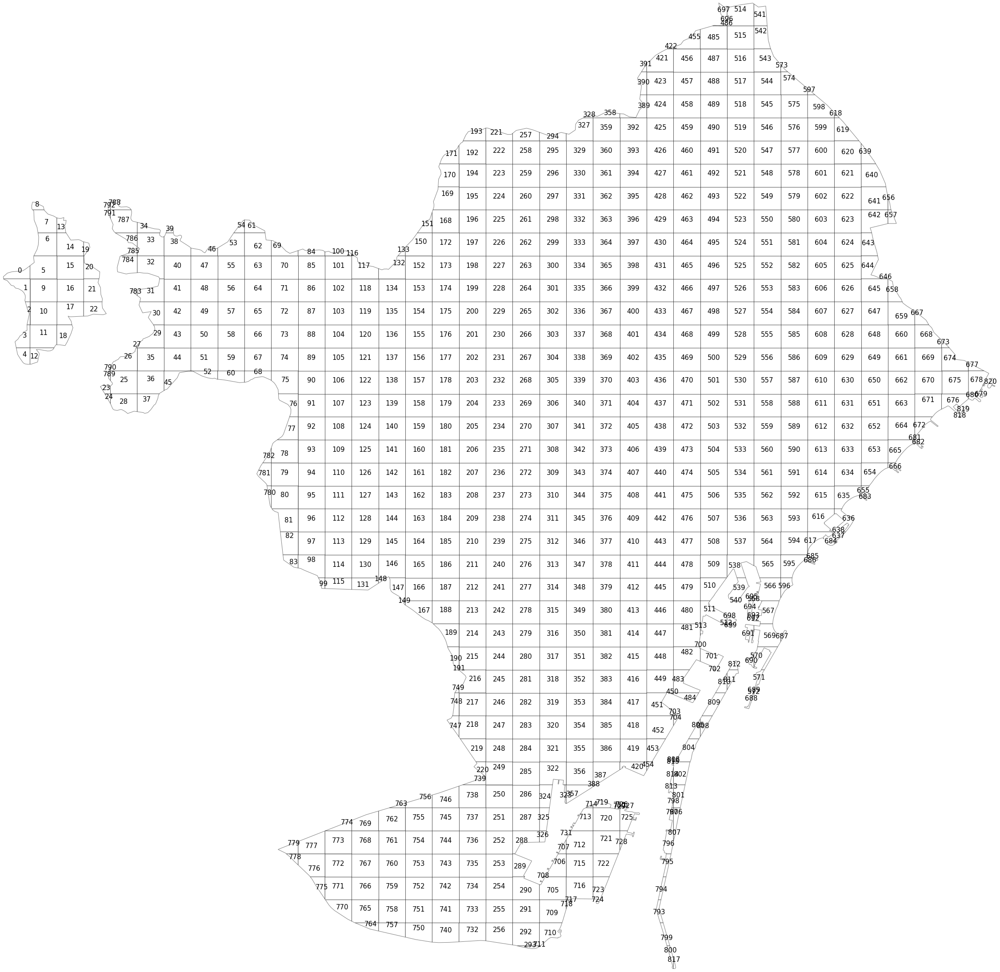

time: 3.99 s (started: 2021-08-15 10:24:06 +02:00)


In [13]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city_proj.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [14]:
# create geodataframe from the square grid polygons
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_proj.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=31 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((420826.183 4586277.586, 420887.629 4..."
1,"POLYGON ((421222.922 4586242.453, 421222.922 4..."
2,"POLYGON ((421222.922 4585843.776, 421222.922 4..."
3,"POLYGON ((421222.922 4585445.098, 421222.922 4..."
4,"POLYGON ((421222.922 4585046.421, 421222.922 4..."


time: 25.4 ms (started: 2021-08-15 10:24:10 +02:00)


<AxesSubplot:>

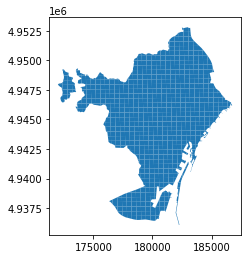

time: 486 ms (started: 2021-08-15 10:24:10 +02:00)


In [15]:
# convert to the NASA crs we introduced earlier
polyframe= polyframe.to_crs(city.crs)
polyframe.plot()

In [16]:
# load library for aggregating raster data into vector polygons
from rasterstats import zonal_stats

time: 56.6 ms (started: 2021-08-15 10:24:11 +02:00)


In [81]:
# compute the mean value of all raster values that fall into a given quadratic cell

affine = out_transform
city_stats = zonal_stats(polyframe, pop_density, affine=affine, stats='mean', nodata=0)
pop_array = np.array([list(item.values())[0] if list(item.values())[0] is not None else 0 for item in city_stats])


time: 1.18 s (started: 2021-08-18 13:27:14 +02:00)


In [18]:
city_stats[:10]

[{'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': 65.49514102935791},
 {'mean': 299.3605041503906},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None}]

time: 2.39 ms (started: 2021-08-15 10:24:11 +02:00)


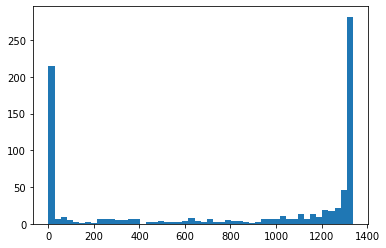

time: 161 ms (started: 2021-08-15 10:24:11 +02:00)


In [19]:
# plot histogram of the obtained population density values
plt.hist(pop_array, bins=50)
plt.show()

In [20]:
# assign the population values as a new column in the geodataframe with the grid cells, 
# so we know which grid cell has what population.

polyframe["population"] = pop_array
polyframe.head()

,geometry,population
0,"POLYGON ((171995.127 4947955.521, 172055.077 4...",0.000000
1,"POLYGON ((172393.786 4947924.760, 172404.109 4...",0.000000
2,"POLYGON ((172404.109 4947526.608, 172414.431 4...",0.000000
3,"POLYGON ((172414.431 4947128.448, 172424.751 4...",65.495141
4,"POLYGON ((172424.751 4946730.279, 172432.112 4...",299.360504


time: 21.8 ms (started: 2021-08-15 10:24:12 +02:00)


(256, 4)
[[1.         0.96078431 0.94117647 1.        ]
 [0.99987697 0.95820069 0.93748558 1.        ]
 [0.99975394 0.95561707 0.93379469 1.        ]
 ...
 [0.41917724 0.00369089 0.05294887 1.        ]
 [0.4115494  0.00184544 0.05196463 1.        ]
 [0.40392157 0.         0.05098039 1.        ]]


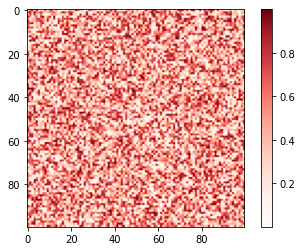

time: 192 ms (started: 2021-08-15 10:24:12 +02:00)


In [21]:
# in order to achieve a nice-looking visualisation, let's create a custom colormap, that fades away into transparency

ncolors = 256
# get cmap
color_array = plt.get_cmap('Reds')(range(ncolors))
print(color_array.shape)
print(color_array)

# change alpha values
color_array[:, -1] = np.linspace(0.3, 1, ncolors)

# create colormap object
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

map_object = LinearSegmentedColormap.from_list(name="Reds_transp", colors=color_array)

# register the colormap object
plt.register_cmap(cmap=map_object)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap='Reds_transp')
plt.colorbar(mappable=h)

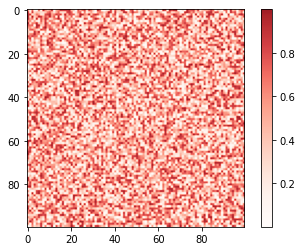

time: 271 ms (started: 2021-08-15 10:24:12 +02:00)


In [22]:
# let's cut it at the top for a better visual impact

def trunc_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list('trunc({n}, {a:.2f}, {b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                                                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Reds_transp')
new_cmap = trunc_colormap(cmap, 0.0, .9)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap=new_cmap)
plt.colorbar(mappable=h)

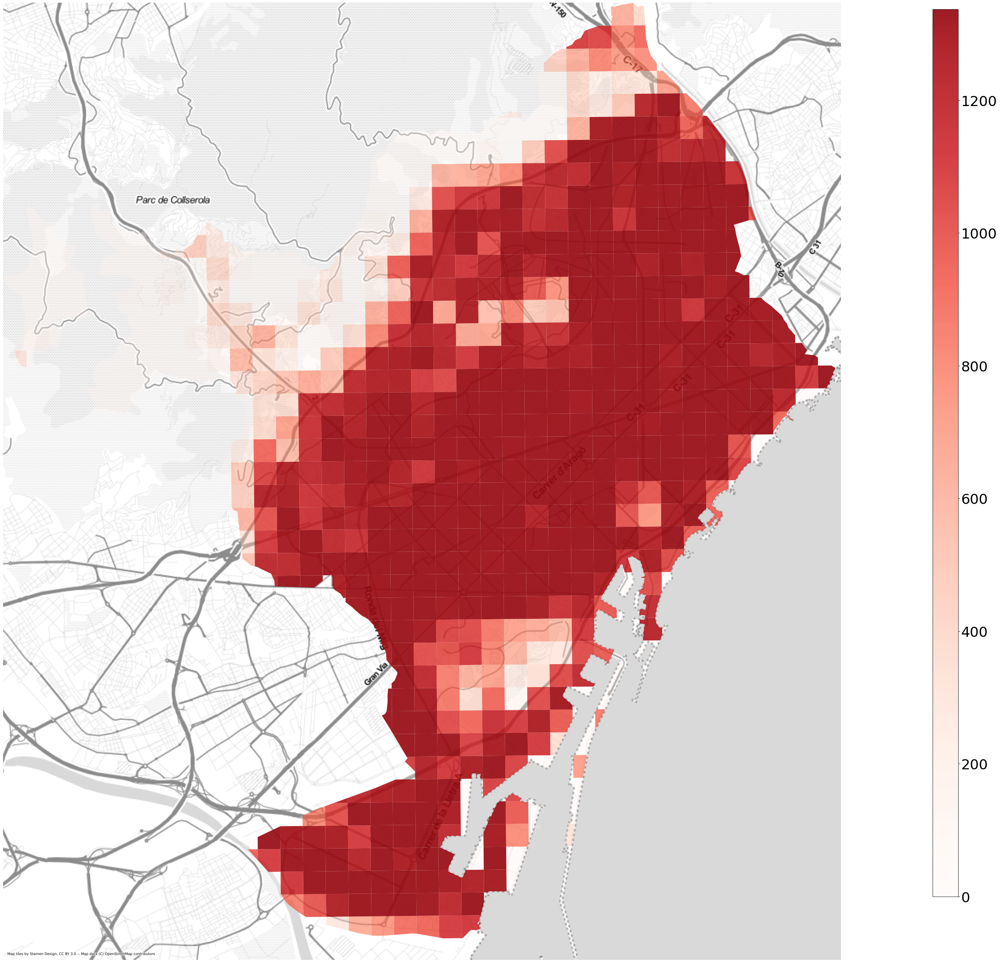

time: 5.33 s (started: 2021-08-15 10:24:12 +02:00)


In [23]:
# plot the population density data on a map background
plt.rcParams.update({'font.size':32})
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

#ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

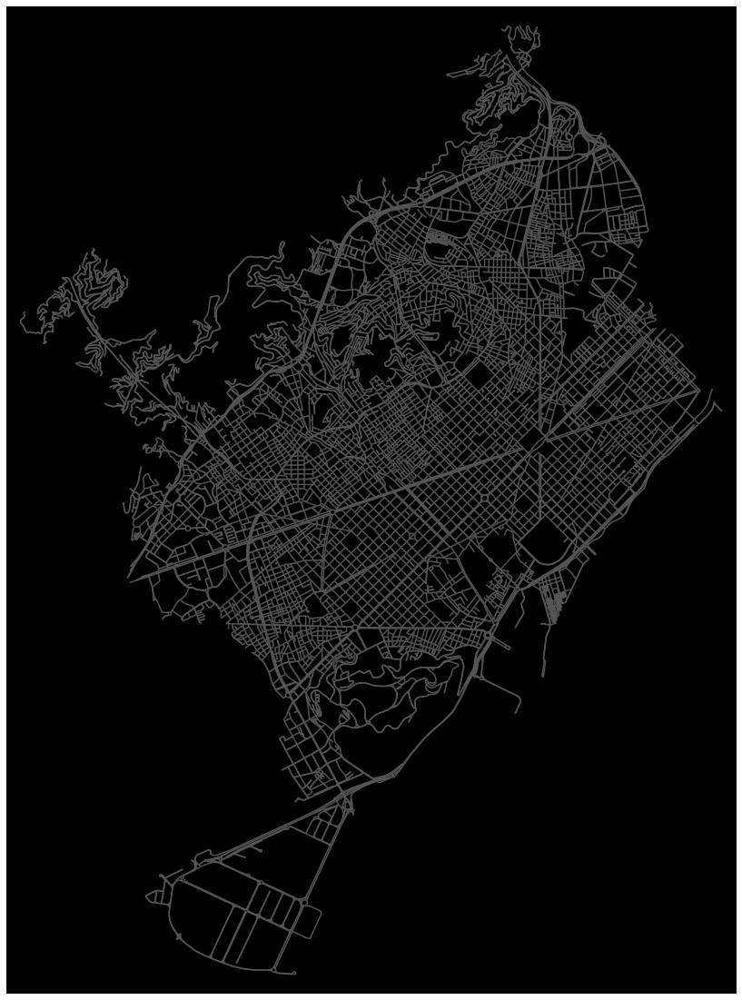

time: 16.5 s (started: 2021-08-15 10:24:17 +02:00)


In [24]:
# download and project a street network
G = ox.graph_from_place(city_name, network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, figsize=(20,20), bgcolor='k', node_size=0, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

In [25]:
# set new coordinate reference system
from pyproj import CRS
crs = CRS.from_epsg(4326)
polyframe_gps = polyframe.to_crs(crs)
print(polyframe_gps.crs)

epsg:4326
time: 261 ms (started: 2021-08-15 10:24:34 +02:00)


<ipython-input-26-5858fc1069bb>:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


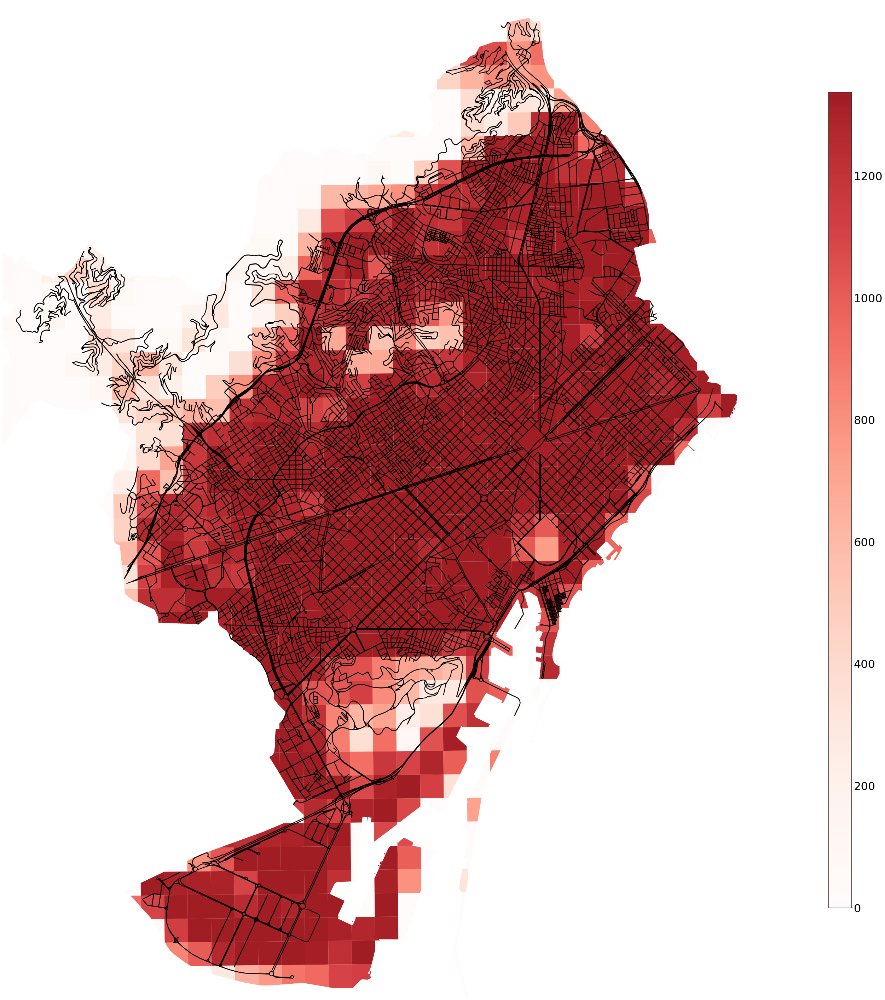

time: 3.27 s (started: 2021-08-15 10:24:34 +02:00)


In [26]:
fig, ax = plt.subplots(figsize=(40,40))

#plt.close()
polyframe_gps.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

ox.plot_graph(G, ax=ax, figsize=(40,40),show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=2.25, node_alpha=0.8, node_zorder=10, edge_color='black')

cbax = fig.add_axes([0.95, 0.1, 0.0225, 0.8])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_gps.population), vmax=max(polyframe_gps.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.axis('off')
plt.tight_layout()
#plt.savefig('../data/Milan_pop_density_with_streets.jpg', dpi=150)
plt.show()

In [27]:
# let's get a list containing the street network node IDs
graph = G.nodes(data=True)
nodelist = [x[0] for x in graph]
nodelist[:10]

[21638845,
 21638855,
 21638859,
 21638861,
 21638865,
 21638867,
 21638868,
 21638869,
 21638877,
 21638878]

time: 3.46 ms (started: 2021-08-15 10:24:37 +02:00)


In [28]:
# then, we create a dataframe containing features of the street nodes (junctions)
from tqdm import tqdm
street_dict = {'osmid':[], 'lon':[], 'lat':[], 'street_count':[]}
for node in tqdm(nodelist):
    street_dict['osmid'].append(node)
    street_dict['lon'].append(graph[node]['x'])
    street_dict['lat'].append(graph[node]['y'])
    street_dict['street_count'].append(graph[node]['street_count'])
    
street_frame = pd.DataFrame(street_dict)
street_frame.head(10)

100%|██████████| 8685/8685 [00:00<00:00, 419812.27it/s]


,osmid,lon,lat,street_count
0,21638845,2.187743,41.370092,3
1,21638855,2.188831,41.374983,3
2,21638859,2.188693,41.376347,3
3,21638861,2.188040,41.378011,3
4,21638865,2.190631,41.376773,1
5,21638867,2.188933,41.378209,4
6,21638868,2.189971,41.378439,3
7,21638869,2.190660,41.378591,4
8,21638877,2.189143,41.379110,4
9,21638878,2.190005,41.379299,4


time: 63.4 ms (started: 2021-08-15 10:24:37 +02:00)


In [29]:
# let's create Point geometries from the lat, lon pairs. 
geometry = [Point(xy) for xy in zip(street_frame.lon, street_frame.lat)]
street_frame = street_frame.drop(['lon', 'lat'], axis=1)
gdf = gpd.GeoDataFrame(street_frame, crs=crs, geometry=geometry)
gdf.tail()

,osmid,street_count,geometry
8680,8930700698,3,POINT (2.12960 41.33107)
8681,8930700699,3,POINT (2.12943 41.33118)
8682,8930700701,3,POINT (2.12878 41.33111)
8683,8930700703,3,POINT (2.12885 41.33095)
8684,8930700706,3,POINT (2.12973 41.33064)


time: 211 ms (started: 2021-08-15 10:24:38 +02:00)


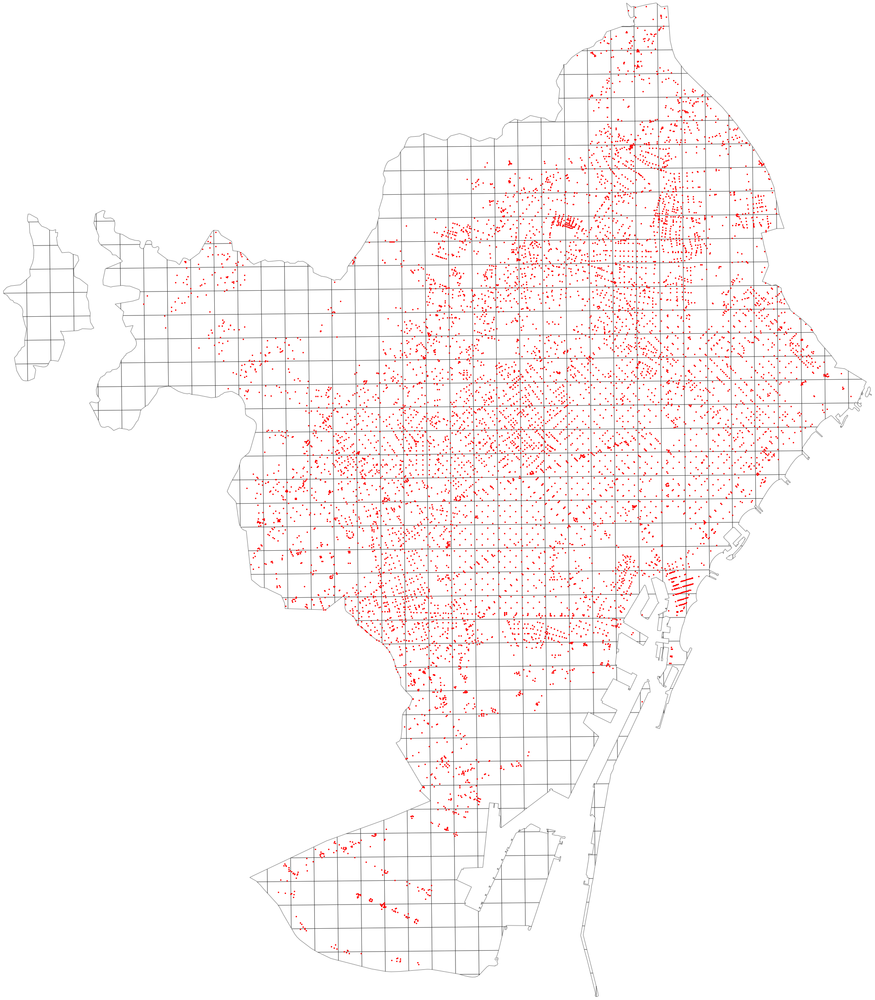

time: 1.93 s (started: 2021-08-15 10:24:38 +02:00)


In [30]:
west, south, east, north = polyframe_gps.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(polyframe_gps.geometry, np.arange(len(polyframe_gps))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)
gdf.plot(ax=ax, color='red', markersize=4, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [31]:
pointInPoly = gpd.sjoin(polyframe_gps, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

8684


,geometry,population,index_right,osmid,street_count
31,"POLYGON ((2.07673 41.42045, 2.07688 41.42103, ...",65.259774,5883,1350686227,3
41,"POLYGON ((2.08573 41.42411, 2.08578 41.42052, ...",0.000000,5882,1350686077,1
42,"POLYGON ((2.08578 41.42052, 2.08583 41.41693, ...",0.000000,4301,568490082,1
42,"POLYGON ((2.08578 41.42052, 2.08583 41.41693, ...",0.000000,6528,1817703603,3
46,"POLYGON ((2.08567 41.42894, 2.08572 41.42890, ...",216.191729,6526,1817382347,3
46,"POLYGON ((2.08567 41.42894, 2.08572 41.42890, ...",216.191729,5923,1374275695,3
46,"POLYGON ((2.08567 41.42894, 2.08572 41.42890, ...",216.191729,6527,1817408825,3
47,"POLYGON ((2.09043 41.42774, 2.09048 41.42415, ...",38.845613,6518,1795369361,3
47,"POLYGON ((2.09043 41.42774, 2.09048 41.42415, ...",38.845613,6519,1795369366,3
47,"POLYGON ((2.09043 41.42774, 2.09048 41.42415, ...",38.845613,6510,1789415226,3


time: 437 ms (started: 2021-08-15 10:24:40 +02:00)


In [32]:
streetcounts = pointInPoly.groupby(pointInPoly.index)['index_right'].count()
counts = pd.DataFrame(streetcounts)
counts.columns = ['counts']
counts

,counts
31,1
41,1
42,2
46,3
47,8
...,...
772,4
773,13
776,3
777,10


time: 7 ms (started: 2021-08-15 10:24:40 +02:00)


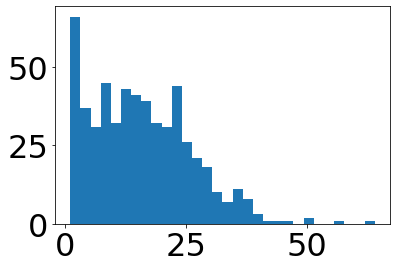

time: 122 ms (started: 2021-08-15 10:24:40 +02:00)


In [33]:
# a quick histogram of the street node counts
plt.hist(counts.counts, bins=30)
plt.show()


In [34]:
polycounts = polyframe_gps.copy()
polycounts['counts'] = counts.counts
polycounts['counts'].fillna(0, inplace=True)
polycounts['counts'] = polycounts['counts'].astype(int)
polycounts

,geometry,population,counts
0,"POLYGON ((2.05250 41.42416, 2.05322 41.42474, ...",0.000000,0
1,"POLYGON ((2.05725 41.42388, 2.05730 41.42029, ...",0.000000,0
2,"POLYGON ((2.05730 41.42029, 2.05735 41.41670, ...",0.000000,0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,0
4,"POLYGON ((2.05741 41.41311, 2.05744 41.41055, ...",299.360504,0
...,...,...,...
816,"POLYGON ((2.17207 41.34935, 2.17210 41.34940, ...",0.000000,0
817,"POLYGON ((2.17253 41.31863, 2.17285 41.31770, ...",0.000000,0
818,"POLYGON ((2.22195 41.40356, 2.22195 41.40357, ...",0.000000,0
819,"POLYGON ((2.22195 41.40357, 2.22200 41.40366, ...",0.000000,0


time: 119 ms (started: 2021-08-15 10:24:40 +02:00)


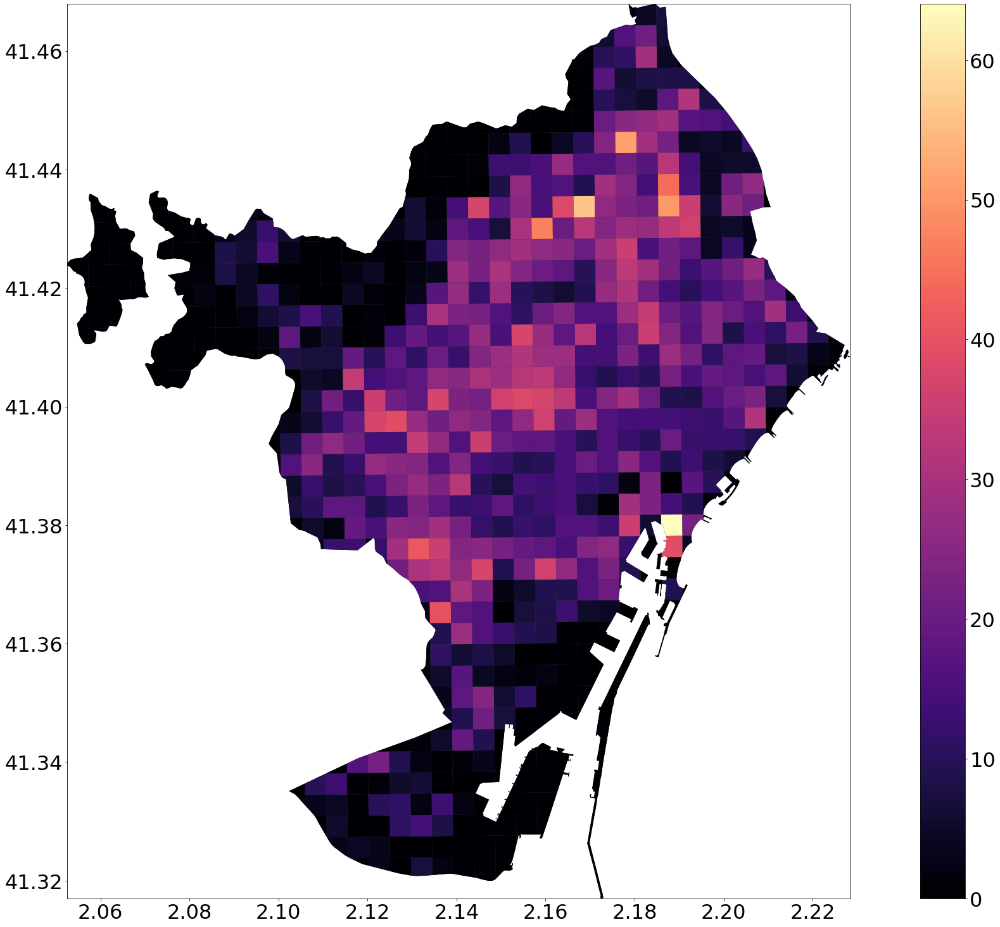

time: 806 ms (started: 2021-08-15 10:24:40 +02:00)


In [35]:
# plot the city street network density
west, south, east, north = polycounts.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polycounts.plot(column='counts',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

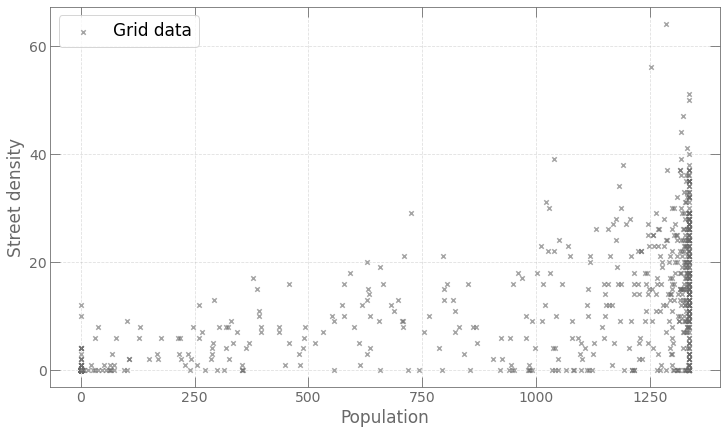

time: 149 ms (started: 2021-08-15 10:24:41 +02:00)


In [36]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(polycounts.population, polycounts.counts, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', label = "Grid data", s=20)

ax.legend(prop={'size': 17})
plt.xlabel('Population', size=17, color='dimgrey')
plt.ylabel('Street density', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
plt.show()

In [37]:
np.corrcoef(polycounts.population, polycounts.counts)[0, 1]

0.6564696065908109

time: 2.44 ms (started: 2021-08-15 10:24:41 +02:00)


In [38]:
import pandana

time: 7.04 ms (started: 2021-08-15 10:24:41 +02:00)


In [39]:
from pandana.loaders import osm

import warnings
warnings.filterwarnings('ignore')

time: 1.09 ms (started: 2021-08-15 10:24:41 +02:00)


In [40]:
# get bounding box of city first
west, south, east, north = polycounts.unary_union.bounds
print(west, south, east, north)

2.0524977 41.31703529999989 2.2283555 41.4679135
time: 135 ms (started: 2021-08-15 10:24:41 +02:00)


In [41]:
network = osm.pdna_network_from_bbox(south, west, north, east)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](41.31703530,2.05249770,41.46791350,2.22835550);>;);out;'}"
Downloaded 49,598.7KB from www.overpass-api.de in 4.20 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 5.33 seconds
Returning OSM data with 309,706 nodes and 76,859 ways...
Edge node pairs completed. Took 71.86 seconds
Returning processed graph with 105,545 nodes and 162,740 edges...
Completed OSM data download and Pandana node and edge table creation in 82.34 seconds
time: 1min 42s (started: 2021-08-15 10:24:41 +02:00)


In [42]:
network.nodes_df.head()

,x,y
id,,
21638729,2.122940,41.316155
21638730,2.119821,41.318563
21638738,2.133123,41.316014
21638740,2.134839,41.317244
21638787,2.127987,41.317511


time: 4.86 ms (started: 2021-08-15 10:26:24 +02:00)


In [43]:
network.edges_df.head()

from          to    distance
21638730 4708152100  21638730  4708152100   16.445655
21638738 21638740    21638738    21638740  198.174423
21638740 1084302826  21638740  1084302826  201.874801
         4861609226  21638740  4861609226   96.172530
21638787 1084302693  21638787  1084302693  181.132980

time: 6.73 ms (started: 2021-08-15 10:26:24 +02:00)


In [44]:
restaurants = osm.node_query(
    south, west, north, east, tags='"amenity"="restaurant"')

time: 2.58 s (started: 2021-08-15 10:26:24 +02:00)


In [45]:
restaurants.head()

,lat,lon,amenity,name,phone,cuisine,opening_hours,addr:housenumber,addr:street,website,...,diet:meat,diet:non-vegetarian,image,building:levels,building:levels:underground,diet:halal,diet:mediterranean,diet:omnivore,start_date,name:nl
id,,,,,,,,,,,,,,,,,,,,,
318788731,41.381687,2.076645,restaurant,Ateneu de Sant Just Desvern,+34 934 73 41 28,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
319840473,41.383643,2.158303,restaurant,Amaltea,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
364731424,41.389518,2.162177,restaurant,Hanibishi,NaN,japanese,"PH,Mo-Su 13:00-16:30,19:00-23:30",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
364829711,41.389997,2.131837,restaurant,Moncho's House,NaN,regional,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
364838793,41.383672,2.180639,restaurant,Taller de Tapas,NaN,spanish,NaN,51,l'Argenteria,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


time: 15.1 ms (started: 2021-08-15 10:26:27 +02:00)


In [46]:
restaurant_nodes = network.get_node_ids(restaurants.lon, restaurants.lat)
network.set(restaurant_nodes, 
            name = 'restaurants')

time: 33.1 ms (started: 2021-08-15 10:26:27 +02:00)


In [47]:
accessibility = network.aggregate(distance = 500,
                                  type = 'count',
                                  name = 'restaurants')
accessibility.describe()

count    105545.000000
mean         19.205277
std          29.840060
min           0.000000
25%           1.000000
50%           5.000000
75%          23.000000
max         194.000000
dtype: float64

time: 1.17 s (started: 2021-08-15 10:26:27 +02:00)


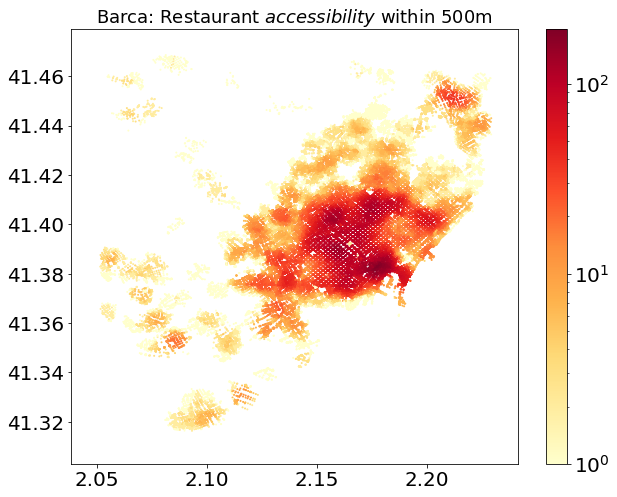

time: 1.33 s (started: 2021-08-15 10:26:28 +02:00)


In [48]:
import matplotlib
plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(10,8))

plt.title('Barca: Restaurant $accessibility$ within 500m', size = 18)
plt.scatter(network.nodes_df.x, network.nodes_df.y, 
            c=accessibility, s=1, cmap='YlOrRd', 
            norm=matplotlib.colors.LogNorm())
cb = plt.colorbar()

plt.show()

In [49]:
network_nodes = network.nodes_df
network_nodes.head()

,x,y
id,,
21638729,2.122940,41.316155
21638730,2.119821,41.318563
21638738,2.133123,41.316014
21638740,2.134839,41.317244
21638787,2.127987,41.317511


time: 5.25 ms (started: 2021-08-15 10:26:30 +02:00)


In [50]:
network_nodes["accessibility"] = accessibility
network_nodes.head()

,x,y,accessibility
id,,,
21638729,2.122940,41.316155,0.0
21638730,2.119821,41.318563,0.0
21638738,2.133123,41.316014,0.0
21638740,2.134839,41.317244,0.0
21638787,2.127987,41.317511,0.0


time: 6.84 ms (started: 2021-08-15 10:26:30 +02:00)


In [51]:
# let's create Point geometries from the lat, lon pairs.
geometry = [Point(xy) for xy in zip(network_nodes.x, network_nodes.y)]
network_nodes = network_nodes.drop(['x', 'y'], axis=1)
network_gdf = gpd.GeoDataFrame(network_nodes, crs=crs, geometry=geometry)
network_gdf.head()

,accessibility,geometry
id,,
21638729,0.0,POINT (2.12294 41.31615)
21638730,0.0,POINT (2.11982 41.31856)
21638738,0.0,POINT (2.13312 41.31601)
21638740,0.0,POINT (2.13484 41.31724)
21638787,0.0,POINT (2.12799 41.31751)


time: 2.2 s (started: 2021-08-15 10:26:30 +02:00)


In [52]:
pointInPoly = gpd.sjoin(polyframe_gps, network_gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

84213


,geometry,population,index_right,accessibility
0,"POLYGON ((2.05250 41.42416, 2.05322 41.42474, ...",0.000000,2894195555,0.0
1,"POLYGON ((2.05725 41.42388, 2.05730 41.42029, ...",0.000000,2894195599,0.0
2,"POLYGON ((2.05730 41.42029, 2.05735 41.41670, ...",0.000000,4221068085,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,4630267859,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,2299957423,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,4630267990,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,2299957791,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,2299957462,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,539784034,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,4630267862,0.0


time: 3.29 s (started: 2021-08-15 10:26:32 +02:00)


In [55]:
aggr_access = pointInPoly.groupby(pointInPoly.index)['accessibility'].mean()
aggr_access_df = pd.DataFrame(aggr_access)
aggr_access_df.columns = ['aggr_access']
aggr_access_df.head()

,aggr_access
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0


time: 8.76 ms (started: 2021-08-15 10:26:54 +02:00)


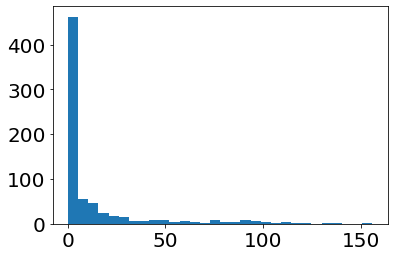

time: 123 ms (started: 2021-08-15 10:26:56 +02:00)


In [56]:
# a quick histogram of the aggregated accessibility
plt.hist(aggr_access_df.aggr_access, bins=30)
plt.show()

In [57]:
polyaccess = polyframe_gps.copy()
polyaccess['aggr_access'] = aggr_access_df.aggr_access
polyaccess['aggr_access'].fillna(0, inplace=True)
#polyaccess['aggr_access'] = polyaccess['aggr_access'].astype(int)
polyaccess

,geometry,population,aggr_access
0,"POLYGON ((2.05250 41.42416, 2.05322 41.42474, ...",0.000000,0.0
1,"POLYGON ((2.05725 41.42388, 2.05730 41.42029, ...",0.000000,0.0
2,"POLYGON ((2.05730 41.42029, 2.05735 41.41670, ...",0.000000,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,0.0
4,"POLYGON ((2.05741 41.41311, 2.05744 41.41055, ...",299.360504,0.0
...,...,...,...
816,"POLYGON ((2.17207 41.34935, 2.17210 41.34940, ...",0.000000,0.0
817,"POLYGON ((2.17253 41.31863, 2.17285 41.31770, ...",0.000000,0.0
818,"POLYGON ((2.22195 41.40356, 2.22195 41.40357, ...",0.000000,0.0
819,"POLYGON ((2.22195 41.40357, 2.22200 41.40366, ...",0.000000,0.0


time: 110 ms (started: 2021-08-15 10:26:58 +02:00)


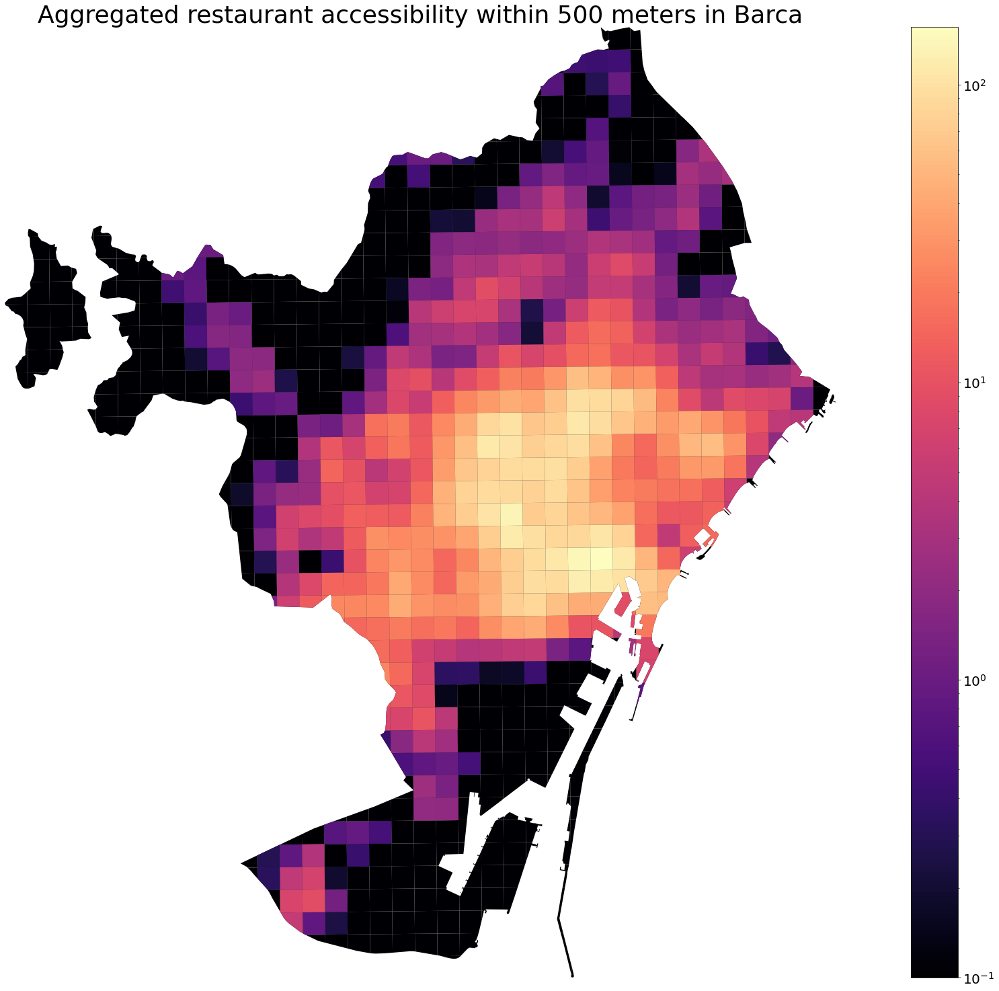

time: 904 ms (started: 2021-08-15 10:27:00 +02:00)


In [58]:
# plot the city aggregated accessibility

LOGMIN = 0.1  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='aggr_access',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Aggregated restaurant accessibility within 500 meters in Barca", size = 36)
ax.axis('off')
plt.show()

In [59]:
polyaccess["pop_int"] = polyaccess.population.astype(int) + 1
polyaccess.head()

,geometry,population,aggr_access,pop_int
0,"POLYGON ((2.05250 41.42416, 2.05322 41.42474, ...",0.000000,0.0,1
1,"POLYGON ((2.05725 41.42388, 2.05730 41.42029, ...",0.000000,0.0,1
2,"POLYGON ((2.05730 41.42029, 2.05735 41.41670, ...",0.000000,0.0,1
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,0.0,66
4,"POLYGON ((2.05741 41.41311, 2.05744 41.41055, ...",299.360504,0.0,300


time: 25.4 ms (started: 2021-08-15 10:27:09 +02:00)


In [60]:
polyaccess["access_normalised"] = polyaccess.aggr_access / polyaccess.pop_int 
polyaccess.head()

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((2.05250 41.42416, 2.05322 41.42474, ...",0.000000,0.0,1,0.0
1,"POLYGON ((2.05725 41.42388, 2.05730 41.42029, ...",0.000000,0.0,1,0.0
2,"POLYGON ((2.05730 41.42029, 2.05735 41.41670, ...",0.000000,0.0,1,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,0.0,66,0.0
4,"POLYGON ((2.05741 41.41311, 2.05744 41.41055, ...",299.360504,0.0,300,0.0


time: 29.7 ms (started: 2021-08-15 10:27:12 +02:00)


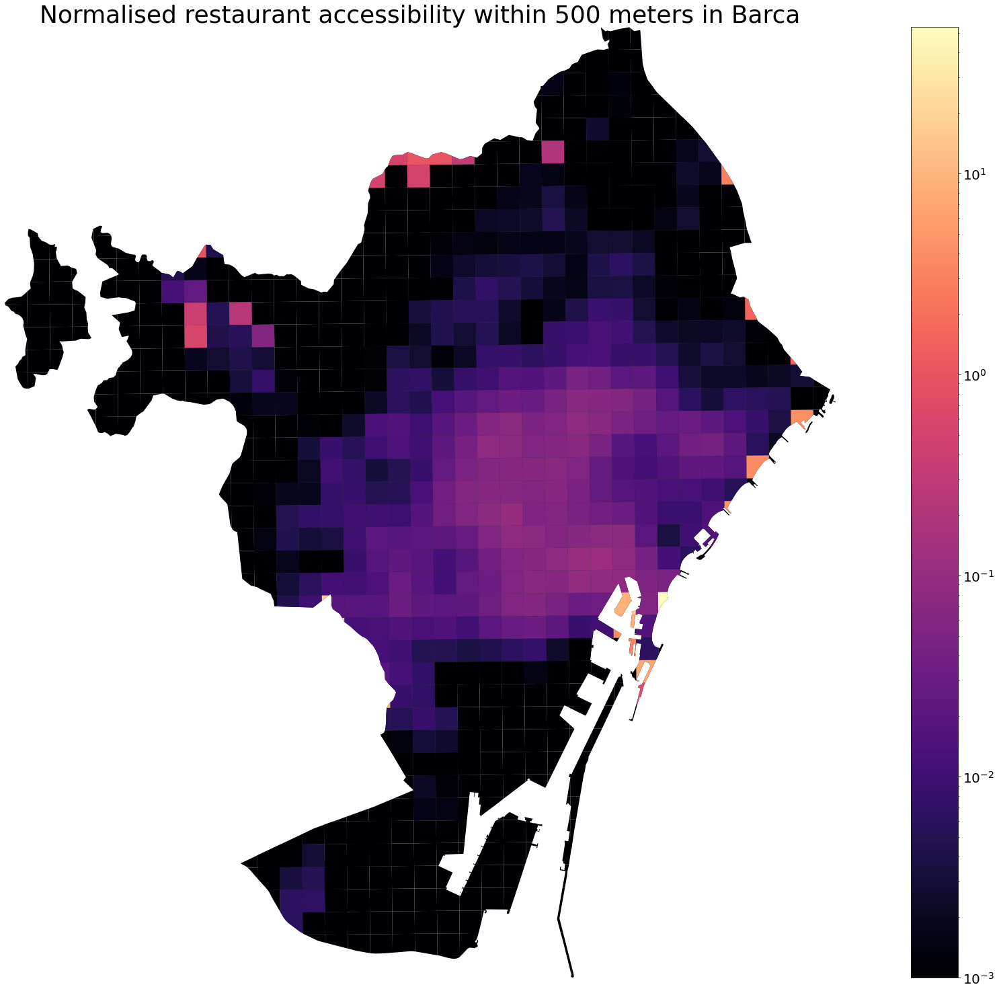

time: 1.28 s (started: 2021-08-15 10:29:07 +02:00)


In [66]:
LOGMIN = 0.001  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='access_normalised',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), LOGMIN), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Normalised restaurant accessibility within 500 meters in Barca", size = 36)
ax.axis('off')
plt.show()

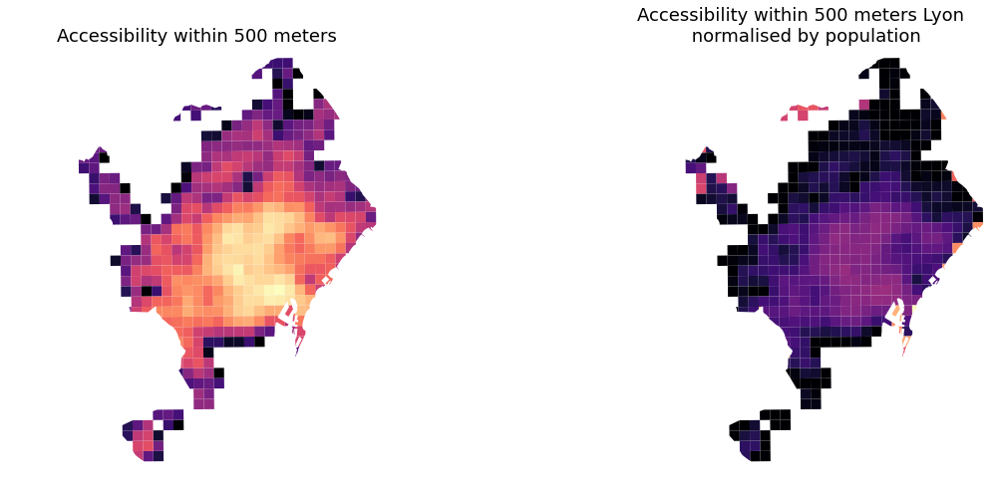

time: 576 ms (started: 2021-08-15 10:27:56 +02:00)


In [65]:
f, ax = plt.subplots(1,2,figsize=(20,8))

polyaccess.plot(column='aggr_access', ax = ax[0], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma')   
  
ax[0].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("Accessibility within 500 meters", size = 18)


polyaccess.plot(column='access_normalised', ax = ax[1], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), 0.001), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma')

ax[1].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Accessibility within 500 meters Lyon \n normalised by population", size = 18)
ax[0].axis('off')
ax[1].axis('off')
plt.show()

In [73]:
polyaccess.aggr_access.mean()

11.629469157481063

time: 2.08 ms (started: 2021-08-15 10:45:16 +02:00)


In [68]:
polyaccess.access_normalised.mean()

0.23411869011548633

time: 2.27 ms (started: 2021-08-15 10:30:08 +02:00)


In [72]:
polyaccess.aggr_access.mean()

11.629469157481063

time: 2.16 ms (started: 2021-08-15 10:44:53 +02:00)


In [74]:
polyaccess.access_normalised.sum()

192.21144458481425

time: 2.31 ms (started: 2021-08-15 10:46:10 +02:00)


In [80]:
polyaccess

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((2.05250 41.42416, 2.05322 41.42474, ...",0.000000,0.0,1,0.0
1,"POLYGON ((2.05725 41.42388, 2.05730 41.42029, ...",0.000000,0.0,1,0.0
2,"POLYGON ((2.05730 41.42029, 2.05735 41.41670, ...",0.000000,0.0,1,0.0
3,"POLYGON ((2.05735 41.41670, 2.05741 41.41311, ...",65.495141,0.0,66,0.0
4,"POLYGON ((2.05741 41.41311, 2.05744 41.41055, ...",299.360504,0.0,300,0.0
...,...,...,...,...,...
816,"POLYGON ((2.17207 41.34935, 2.17210 41.34940, ...",0.000000,0.0,1,0.0
817,"POLYGON ((2.17253 41.31863, 2.17285 41.31770, ...",0.000000,0.0,1,0.0
818,"POLYGON ((2.22195 41.40356, 2.22195 41.40357, ...",0.000000,0.0,1,0.0
819,"POLYGON ((2.22195 41.40357, 2.22200 41.40366, ...",0.000000,0.0,1,0.0


time: 121 ms (started: 2021-08-17 12:44:53 +02:00)


In [82]:
#final score
polyaccess.access_normalised.mean()


0.23411869011548633

time: 4.51 ms (started: 2021-08-18 13:27:44 +02:00)
